This project is a collaboration between Yeo Ping En Charmaine and Ma Ka Kui.

# Data Cleaning

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
import statsmodels.api as sm
%matplotlib inline

from pandas_profiling import ProfileReport
from matplotlib.cbook import boxplot_stats
from sklearn.preprocessing import StandardScaler, Binarizer 
from sklearn.model_selection import train_test_split, GridSearchCV , RandomizedSearchCV, KFold, cross_val_score
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import roc_curve, confusion_matrix, classification_report, roc_auc_score, roc_curve, accuracy_score


In [2]:
df = pd.read_csv("OnlineNewsPopularity.csv")
df

,n_tokens_content,n_unique_tokens,num_hrefs,num_imgs,num_videos,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_tech,is_weekend,global_subjectivity,global_sentiment_polarity,title_subjectivity,shares,avg_positive_polarity,title_sentiment_polarity
0,219,0.663594,4,1,0,1,0,0,0,0.521617,0.092562,0.500000,593,0.378636,-0.187500
1,255,0.604743,3,1,0,0,1,0,0,0.341246,0.148948,0.000000,711,0.286915,0.000000
2,211,0.575130,3,1,0,0,1,0,0,0.702222,0.323333,0.000000,1500,0.495833,0.000000
3,531,0.503788,9,1,0,1,0,0,0,0.429850,0.100705,0.000000,1200,0.385965,0.000000
4,1072,0.415646,19,20,0,0,0,1,0,0.513502,0.281003,0.454545,505,0.411127,0.136364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,346,0.529052,9,1,1,0,0,1,0,0.482679,0.141964,0.100000,1800,0.333791,0.000000
39640,328,0.696296,9,3,48,0,0,0,0,0.564374,0.194249,0.300000,1900,0.374825,1.000000
39641,442,0.516355,24,12,1,0,0,0,0,0.510296,0.024609,0.454545,1900,0.307273,0.136364
39642,682,0.539493,10,1,0,0,0,0,0,0.358578,-0.008066,0.000000,1100,0.236851,0.000000


In [3]:
df.columns = df.columns.str.replace(' ', '')
df.columns 

# Column names are now cleaned.

Index(['n_tokens_content', 'n_unique_tokens', 'num_hrefs', 'num_imgs',
       'num_videos', 'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_tech', 'is_weekend', 'global_subjectivity',
       'global_sentiment_polarity', 'title_subjectivity', 'shares',
       'avg_positive_polarity', 'title_sentiment_polarity'],
      dtype='object')

In [4]:
df.describe()

# Most articles have shares in the 1000s range, median is 1400, Q3 is 2800. 
# Rare few have in the 10,000s range and even rarer few in 100000s range

,n_tokens_content,n_unique_tokens,num_hrefs,num_imgs,num_videos,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_tech,is_weekend,global_subjectivity,global_sentiment_polarity,title_subjectivity,shares,avg_positive_polarity,title_sentiment_polarity
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,546.514731,0.548216,10.883690,4.544143,1.249874,0.178009,0.157855,0.185299,0.130915,0.443370,0.119309,0.282353,3395.380184,0.353825,0.071425
std,471.107508,3.520708,11.332017,8.309434,4.107855,0.382525,0.364610,0.388545,0.337312,0.116685,0.096931,0.324247,11626.950749,0.104542,0.265450
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.393750,0.000000,1.000000,0.000000,-1.000000
25%,246.000000,0.470870,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.396167,0.057757,0.000000,946.000000,0.306244,0.000000
50%,409.000000,0.539226,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.453457,0.119117,0.150000,1400.000000,0.358755,0.000000
75%,716.000000,0.608696,14.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.508333,0.177832,0.500000,2800.000000,0.411428,0.150000
max,8474.000000,701.000000,304.000000,128.000000,91.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.727841,1.000000,843300.000000,1.000000,1.000000


In [5]:
df.info()

# Most datatypes are integers or floats. No need for further encoding. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   n_tokens_content               39644 non-null  int64  
 1   n_unique_tokens                39644 non-null  float64
 2   num_hrefs                      39644 non-null  int64  
 3   num_imgs                       39644 non-null  int64  
 4   num_videos                     39644 non-null  int64  
 5   data_channel_is_entertainment  39644 non-null  int64  
 6   data_channel_is_bus            39644 non-null  int64  
 7   data_channel_is_tech           39644 non-null  int64  
 8   is_weekend                     39644 non-null  int64  
 9   global_subjectivity            39644 non-null  float64
 10  global_sentiment_polarity      39644 non-null  float64
 11  title_subjectivity             39644 non-null  float64
 12  shares                         39644 non-null 

In [6]:
df.shares.median()

1400.0

In [57]:
ProfileReport(df, title="Pandas Profiling Report")

<u> General takeways: </u>

- There are no null values, no action required on that aspect. 

- 97 Duplicates: To drop.

- Based on heatmap, factors are not very correlated. However, to do VIF to check for multicollinearity between more than 2 factors.

<u> Insights on the Distributions of Features </u> 

- Article Technicalities:
       - Several features like n_tokens_content, num_hrefs, even shares are right-skewed. 
       - Makes sense because it's easier for content production to have a certain number of words rather than more-- especially since there has been a trend to keep articles to a certain word limit and lower in order to retain readership. 

- Type of Articles:
       - Boolean data types (no need to encode)

- Metrics on article 
       - global_subjectivity, global_sentiment_polarity, and avg_positive_polarity all have a Gaussian Distribution, relatively unskewed. 

D:\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


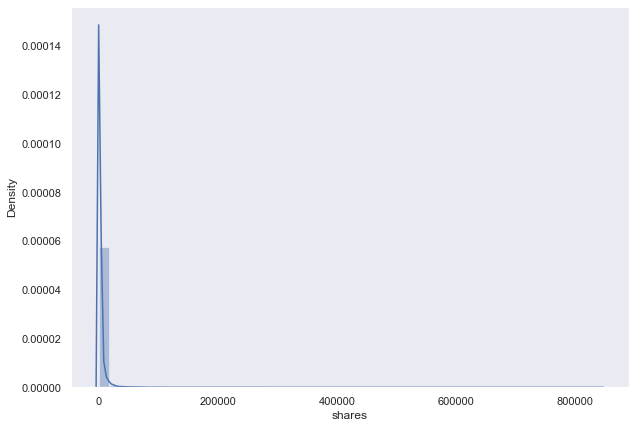

In [8]:
# Closer look at the distribution of the shares target feature

sns.set(rc={'figure.figsize':(10,7)})
sns.set_style("dark")

sns.distplot(df.shares);

# Shares has a right-skewed, very weird distribution with a great number of outliers and a wide range. 
# We'll need to use log10, and standardise some features. 

D:\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


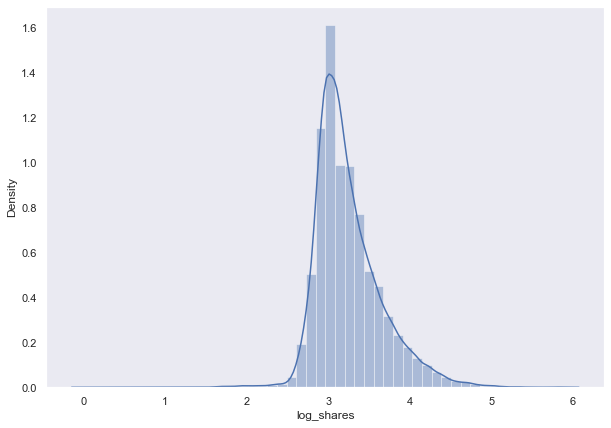

In [9]:
# Using log10 to handle the weird distribution of share, and great number of outliers.

df['log_shares'] = np.log10(df.shares)
sns.distplot(df.log_shares); 

# log_shares (and shares) provides a better representation, still right-skewed Gaussian Distribution.

In [10]:
df.drop_duplicates(inplace = True)
df

,n_tokens_content,n_unique_tokens,num_hrefs,num_imgs,num_videos,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_tech,is_weekend,global_subjectivity,global_sentiment_polarity,title_subjectivity,shares,avg_positive_polarity,title_sentiment_polarity,log_shares
0,219,0.663594,4,1,0,1,0,0,0,0.521617,0.092562,0.500000,593,0.378636,-0.187500,2.773055
1,255,0.604743,3,1,0,0,1,0,0,0.341246,0.148948,0.000000,711,0.286915,0.000000,2.851870
2,211,0.575130,3,1,0,0,1,0,0,0.702222,0.323333,0.000000,1500,0.495833,0.000000,3.176091
3,531,0.503788,9,1,0,1,0,0,0,0.429850,0.100705,0.000000,1200,0.385965,0.000000,3.079181
4,1072,0.415646,19,20,0,0,0,1,0,0.513502,0.281003,0.454545,505,0.411127,0.136364,2.703291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,346,0.529052,9,1,1,0,0,1,0,0.482679,0.141964,0.100000,1800,0.333791,0.000000,3.255273
39640,328,0.696296,9,3,48,0,0,0,0,0.564374,0.194249,0.300000,1900,0.374825,1.000000,3.278754
39641,442,0.516355,24,12,1,0,0,0,0,0.510296,0.024609,0.454545,1900,0.307273,0.136364,3.278754
39642,682,0.539493,10,1,0,0,0,0,0,0.358578,-0.008066,0.000000,1100,0.236851,0.000000,3.041393


D:\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


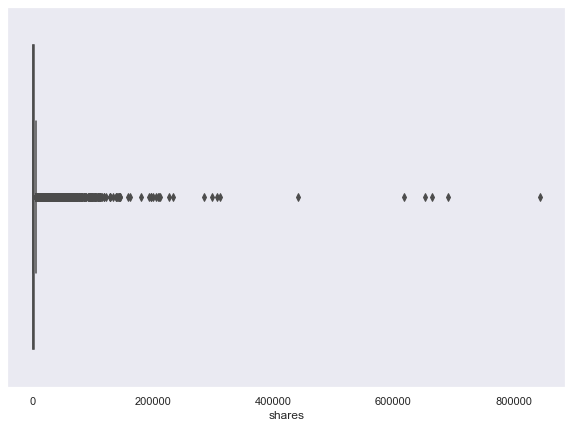

In [11]:
# Checking for outliers

sns.boxplot(df.shares); 

# There are outliers, mainly in the well-performing side.

D:\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


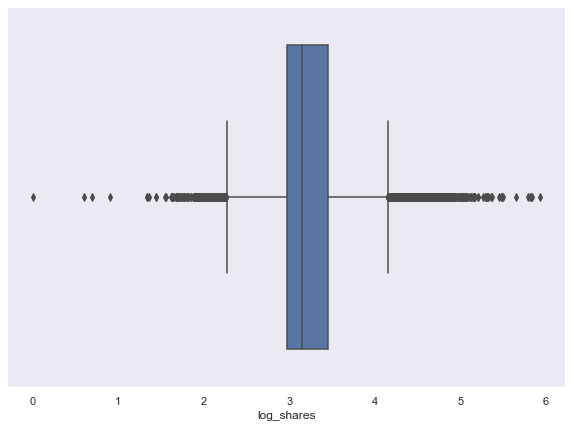

In [12]:
# Better graphical representation with log_shares

sns.boxplot(df.log_shares); 

In [13]:
# Checking number of outliers

Q1 = df['shares'].quantile(0.25)
Q3 = df['shares'].quantile(0.75)
IQR = Q3 - Q1

df_out = df[~((df['shares'] < (Q1 - 1.5 * IQR)) | (df['shares'] > (Q3 + 1.5 * IQR)))]
df_out

# There are 4541 outliers. 

,n_tokens_content,n_unique_tokens,num_hrefs,num_imgs,num_videos,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_tech,is_weekend,global_subjectivity,global_sentiment_polarity,title_subjectivity,shares,avg_positive_polarity,title_sentiment_polarity,log_shares
0,219,0.663594,4,1,0,1,0,0,0,0.521617,0.092562,0.500000,593,0.378636,-0.187500,2.773055
1,255,0.604743,3,1,0,0,1,0,0,0.341246,0.148948,0.000000,711,0.286915,0.000000,2.851870
2,211,0.575130,3,1,0,0,1,0,0,0.702222,0.323333,0.000000,1500,0.495833,0.000000,3.176091
3,531,0.503788,9,1,0,1,0,0,0,0.429850,0.100705,0.000000,1200,0.385965,0.000000,3.079181
4,1072,0.415646,19,20,0,0,0,1,0,0.513502,0.281003,0.454545,505,0.411127,0.136364,2.703291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,346,0.529052,9,1,1,0,0,1,0,0.482679,0.141964,0.100000,1800,0.333791,0.000000,3.255273
39640,328,0.696296,9,3,48,0,0,0,0,0.564374,0.194249,0.300000,1900,0.374825,1.000000,3.278754
39641,442,0.516355,24,12,1,0,0,0,0,0.510296,0.024609,0.454545,1900,0.307273,0.136364,3.278754
39642,682,0.539493,10,1,0,0,0,0,0,0.358578,-0.008066,0.000000,1100,0.236851,0.000000,3.041393


In [16]:
# We'll calculate with outliers on log_share:

under = (157/1525) *100
well = (1368/1525) *100
print("% of Under performing articles: ", under)
print("% of Well performing articles: ", well)

% of Under performing articles:  10.295081967213115
% of Well performing articles:  89.70491803278688


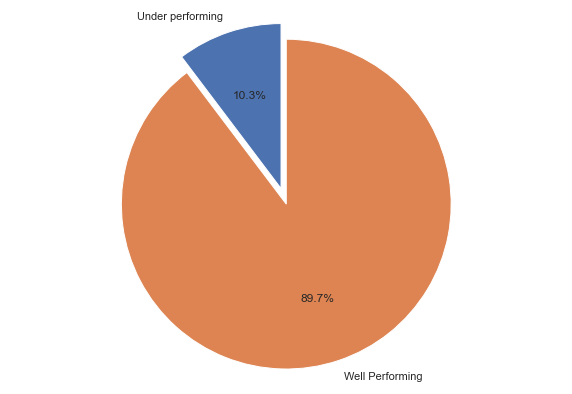

In [17]:
labels = 'Under performing', 'Well Performing'
sizes = [under,well]
explode = (0.1, 0)  

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode = explode, labels=labels, autopct='%1.1f%%',
        startangle=90)
ax1.axis('equal')

plt.show()

In [18]:
# VIF to check for multicollinearity between >2 features. 
  
# the independent variables set 
X = df.drop(['log_shares'], axis=1)

# VIF dataframe 
vif_data = pd.DataFrame() 
vif_data["Feature"] = X.columns 
  
# calculating VIF for each feature 
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))] 
print(vif_data)

# Features with a VIF >= 5 should be feature engineered, but the models perform better with features as is. 
# Might be that classification models are more forgiving of high VIF than Regression

                          Feature        VIF
0                n_tokens_content   3.075608
1                 n_unique_tokens   1.023617
2                       num_hrefs   2.633094
3                        num_imgs   1.644109
4                      num_videos   1.185752
5   data_channel_is_entertainment   1.402388
6             data_channel_is_bus   1.348298
7            data_channel_is_tech   1.430949
8                      is_weekend   1.157946
9             global_subjectivity  20.736857
10      global_sentiment_polarity   3.602697
11             title_subjectivity   1.887487
12                         shares   1.089346
13          avg_positive_polarity  22.434853
14       title_sentiment_polarity   1.214415


In [19]:
df[df.n_unique_tokens >= 1] #error in this entry as n_unique_tokens > 1.

df = df.drop(31037)
df

,n_tokens_content,n_unique_tokens,num_hrefs,num_imgs,num_videos,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_tech,is_weekend,global_subjectivity,global_sentiment_polarity,title_subjectivity,shares,avg_positive_polarity,title_sentiment_polarity,log_shares
0,219,0.663594,4,1,0,1,0,0,0,0.521617,0.092562,0.500000,593,0.378636,-0.187500,2.773055
1,255,0.604743,3,1,0,0,1,0,0,0.341246,0.148948,0.000000,711,0.286915,0.000000,2.851870
2,211,0.575130,3,1,0,0,1,0,0,0.702222,0.323333,0.000000,1500,0.495833,0.000000,3.176091
3,531,0.503788,9,1,0,1,0,0,0,0.429850,0.100705,0.000000,1200,0.385965,0.000000,3.079181
4,1072,0.415646,19,20,0,0,0,1,0,0.513502,0.281003,0.454545,505,0.411127,0.136364,2.703291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,346,0.529052,9,1,1,0,0,1,0,0.482679,0.141964,0.100000,1800,0.333791,0.000000,3.255273
39640,328,0.696296,9,3,48,0,0,0,0,0.564374,0.194249,0.300000,1900,0.374825,1.000000,3.278754
39641,442,0.516355,24,12,1,0,0,0,0,0.510296,0.024609,0.454545,1900,0.307273,0.136364,3.278754
39642,682,0.539493,10,1,0,0,0,0,0,0.358578,-0.008066,0.000000,1100,0.236851,0.000000,3.041393


D:\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


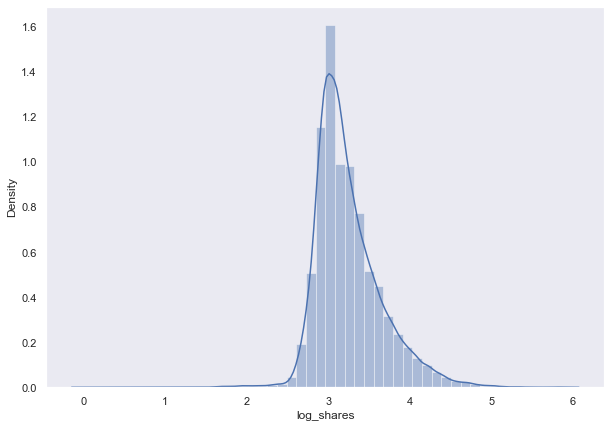

In [20]:
sns.distplot(df.log_shares); 

# log_shares (and shares) provides a better representation, still right-skewed Gaussian Distribution.

Global subjectivity is the text subjectivity of an article, and avg_positive_polarity is the average polarity of positive words. this suggests the articles have positive subjectivity to them. 

# Exploratory Data Analysis

Types of Articles: 

In [62]:
print(df.data_channel_is_entertainment.value_counts())
print(df.data_channel_is_bus.value_counts())
print(df.data_channel_is_tech.value_counts())

0    32491
1     7055
Name: data_channel_is_entertainment, dtype: int64
0    33289
1     6257
Name: data_channel_is_bus, dtype: int64
0    32200
1     7346
Name: data_channel_is_tech, dtype: int64


In [63]:
7055+32491

39546

In [67]:
ent = (7055/39546) *100
bus = (6257/39546) *100
tech = (7346/39546) *100
other = (39546 - 7055 - 6257 - 7346)/39546 * 100
print(ent)
print(bus)
print(tech)
print(other)

17.83998381631518
15.822080614980022
18.57583573559905
47.76209983310575


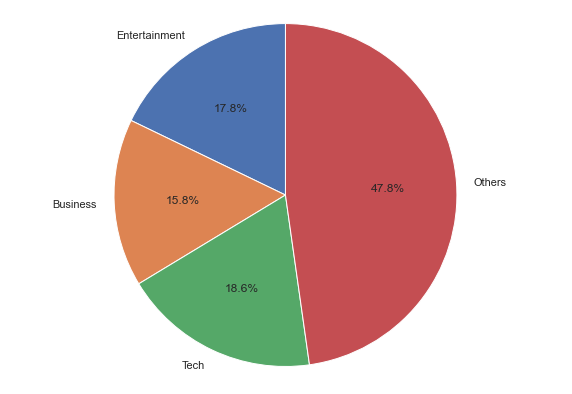

In [69]:
labels = 'Entertainment', 'Business', 'Tech', 'Others'
sizes = [ent, bus, tech, other]
# explode = (0.1, 0.1, 0,1, 0)  

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        startangle=90)
ax1.axis('equal')

plt.show()

# ML Modelling

In [22]:
# Standardisation

sc = StandardScaler()
df_out_s = sc.fit_transform(df_out) #standard scale all columns 
df_out_s = pd.DataFrame(df_out, columns = df.columns)

In [23]:
df['popular'] = df.shares

df['popular'] = (df['popular'] < 1399).astype(int)
df

,n_tokens_content,n_unique_tokens,num_hrefs,num_imgs,num_videos,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_tech,is_weekend,global_subjectivity,global_sentiment_polarity,title_subjectivity,shares,avg_positive_polarity,title_sentiment_polarity,log_shares,popular
0,219,0.663594,4,1,0,1,0,0,0,0.521617,0.092562,0.500000,593,0.378636,-0.187500,2.773055,1
1,255,0.604743,3,1,0,0,1,0,0,0.341246,0.148948,0.000000,711,0.286915,0.000000,2.851870,1
2,211,0.575130,3,1,0,0,1,0,0,0.702222,0.323333,0.000000,1500,0.495833,0.000000,3.176091,0
3,531,0.503788,9,1,0,1,0,0,0,0.429850,0.100705,0.000000,1200,0.385965,0.000000,3.079181,1
4,1072,0.415646,19,20,0,0,0,1,0,0.513502,0.281003,0.454545,505,0.411127,0.136364,2.703291,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,346,0.529052,9,1,1,0,0,1,0,0.482679,0.141964,0.100000,1800,0.333791,0.000000,3.255273,0
39640,328,0.696296,9,3,48,0,0,0,0,0.564374,0.194249,0.300000,1900,0.374825,1.000000,3.278754,0
39641,442,0.516355,24,12,1,0,0,0,0,0.510296,0.024609,0.454545,1900,0.307273,0.136364,3.278754,0
39642,682,0.539493,10,1,0,0,0,0,0,0.358578,-0.008066,0.000000,1100,0.236851,0.000000,3.041393,1


In [24]:
# Create and test for standardised dataset without outliers

df_out_s['popular'] = df_out_s.shares
df_out_s['popular'] = (df_out_s['popular'] < 1399).astype(int)
df_out_s

,n_tokens_content,n_unique_tokens,num_hrefs,num_imgs,num_videos,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_tech,is_weekend,global_subjectivity,global_sentiment_polarity,title_subjectivity,shares,avg_positive_polarity,title_sentiment_polarity,log_shares,popular
0,219,0.663594,4,1,0,1,0,0,0,0.521617,0.092562,0.500000,593,0.378636,-0.187500,2.773055,1
1,255,0.604743,3,1,0,0,1,0,0,0.341246,0.148948,0.000000,711,0.286915,0.000000,2.851870,1
2,211,0.575130,3,1,0,0,1,0,0,0.702222,0.323333,0.000000,1500,0.495833,0.000000,3.176091,0
3,531,0.503788,9,1,0,1,0,0,0,0.429850,0.100705,0.000000,1200,0.385965,0.000000,3.079181,1
4,1072,0.415646,19,20,0,0,0,1,0,0.513502,0.281003,0.454545,505,0.411127,0.136364,2.703291,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,346,0.529052,9,1,1,0,0,1,0,0.482679,0.141964,0.100000,1800,0.333791,0.000000,3.255273,0
39640,328,0.696296,9,3,48,0,0,0,0,0.564374,0.194249,0.300000,1900,0.374825,1.000000,3.278754,0
39641,442,0.516355,24,12,1,0,0,0,0,0.510296,0.024609,0.454545,1900,0.307273,0.136364,3.278754,0
39642,682,0.539493,10,1,0,0,0,0,0,0.358578,-0.008066,0.000000,1100,0.236851,0.000000,3.041393,1


In [25]:
target = df_out_s.popular
features = df_out_s.drop(['popular','shares','log_shares'], axis=1) 

X_train , X_test , Y_train , Y_test = train_test_split(features, target, test_size = 0.3, random_state = 42)

## KNN

In [26]:
KNN = KNeighborsClassifier(p = 2)

KNN.fit(X_train, Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [27]:
KNN_predict = KNN.predict(X_train)

In [28]:
print(classification_report(Y_train, KNN_predict))

              precision    recall  f1-score   support

           0       0.70      0.65      0.67     11555
           1       0.71      0.75      0.73     12950

    accuracy                           0.70     24505
   macro avg       0.70      0.70      0.70     24505
weighted avg       0.70      0.70      0.70     24505



In [29]:
KNN2_predict = KNN.predict(X_test)

In [30]:
print(classification_report(Y_test, KNN2_predict))

              precision    recall  f1-score   support

           0       0.51      0.46      0.48      5012
           1       0.54      0.59      0.56      5491

    accuracy                           0.53     10503
   macro avg       0.52      0.52      0.52     10503
weighted avg       0.53      0.53      0.53     10503



In [31]:
KNN.get_params().keys()

dict_keys(['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'])

In [32]:
# GridSearchCV
parameters = {'n_neighbors' : [100, 200, 300],
              'leaf_size' : range(1,20)}         
              
knn_grid = GridSearchCV(KNN,
                        parameters,
                        cv = 5,
                        n_jobs = -1,
                        verbose=True)

knn_grid.fit(X_test, Y_test)

print(knn_grid.best_params_)

Fitting 5 folds for each of 57 candidates, totalling 285 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   19.0s


{'leaf_size': 1, 'n_neighbors': 200}


[Parallel(n_jobs=-1)]: Done 285 out of 285 | elapsed:   25.7s finished


In [33]:
KNN = KNeighborsClassifier(n_neighbors = 200, p = 2, leaf_size= 1)  # p=2 uses euclidean distance

KNN.fit(X_train, Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=1, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=200, p=2,
                     weights='uniform')

In [34]:
KNN3_predict = KNN.predict(X_test)

In [35]:
print(classification_report(Y_test, KNN3_predict))

              precision    recall  f1-score   support

           0       0.53      0.29      0.37      5012
           1       0.54      0.77      0.63      5491

    accuracy                           0.54     10503
   macro avg       0.53      0.53      0.50     10503
weighted avg       0.54      0.54      0.51     10503



## Random Forest Classifier

#### Evaluation with Train Set

In [36]:
rf = RandomForestClassifier(random_state = 42)
# Train the model on training data
rf.fit(X_train, Y_train);

In [37]:
rf_predict = rf.predict(X_train)
print(classification_report(Y_train, rf_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11555
           1       1.00      1.00      1.00     12950

    accuracy                           1.00     24505
   macro avg       1.00      1.00      1.00     24505
weighted avg       1.00      1.00      1.00     24505



#### Feature Importance

<AxesSubplot:>

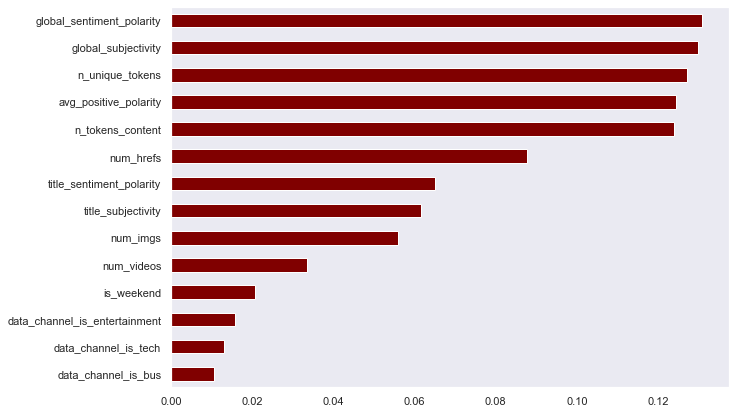

In [38]:
feat_importances = pd.Series(rf.feature_importances_, index= X_train.columns)
feat_importances = feat_importances.sort_values(ascending = True)
feat_importances.plot(kind='barh', color = 'Maroon', sort_columns = True)

#### Evaluation with Test Set

In [39]:
rf2_predict = rf.predict(X_test)

In [40]:
print(classification_report(Y_test, rf2_predict))

              precision    recall  f1-score   support

           0       0.60      0.54      0.57      5012
           1       0.61      0.66      0.64      5491

    accuracy                           0.61     10503
   macro avg       0.60      0.60      0.60     10503
weighted avg       0.61      0.61      0.60     10503



In [41]:
# GridSearchCV
parameters = {'max_depth': range(1,5),
              'n_estimators': (1,10,100),
              'criterion' : ['gini','entropy'],
              'max_leaf_nodes' : range(1,7),
              'oob_score': [True,False]}         
              
rf_grid = GridSearchCV(rf,
                        parameters,
                        cv = 5,
                        n_jobs = -1,
                        verbose=True)

rf_grid.fit(X_test, Y_test)

print(rf_grid.best_params_)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 352 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 794 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done 1144 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 1440 out of 1440 | elapsed:   59.6s finished


{'criterion': 'entropy', 'max_depth': 4, 'max_leaf_nodes': 6, 'n_estimators': 100, 'oob_score': True}


In [42]:
rf = RandomForestClassifier(random_state = 42, criterion= 'entropy', max_depth = 4, max_leaf_nodes = 6, n_estimators= 100, oob_score = True)
# Train the model on training data
rf.fit(X_train, Y_train);

In [43]:
rf3_predict = rf.predict(X_test)

In [44]:
print(classification_report(Y_test, rf3_predict))

              precision    recall  f1-score   support

           0       0.62      0.44      0.51      5012
           1       0.60      0.75      0.67      5491

    accuracy                           0.60     10503
   macro avg       0.61      0.60      0.59     10503
weighted avg       0.61      0.60      0.59     10503



## XGBoost Classification

#### Evaluation with Train Set

In [45]:
XGB = xgb.sklearn.XGBClassifier()

In [46]:
XGB.fit(X_train, Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [47]:
XGB_predict = XGB.predict(X_train)

In [48]:
print(classification_report(Y_train, XGB_predict))

              precision    recall  f1-score   support

           0       0.81      0.72      0.76     11555
           1       0.77      0.85      0.81     12950

    accuracy                           0.79     24505
   macro avg       0.79      0.78      0.79     24505
weighted avg       0.79      0.79      0.79     24505



#### Feature Importance

<AxesSubplot:>

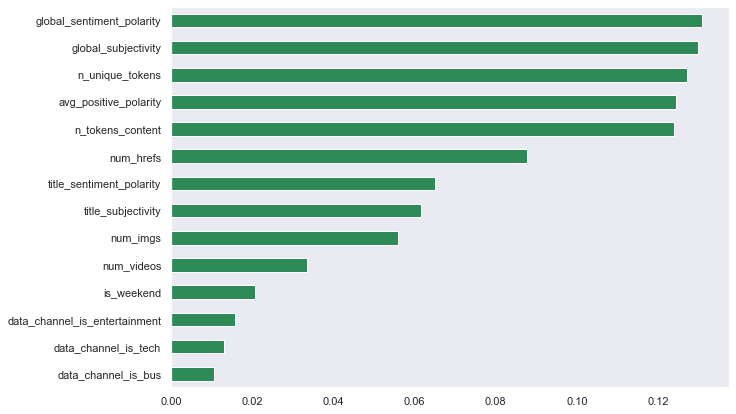

In [49]:
xgbfeat_importances = pd.Series(XGB.feature_importances_, index= X_train.columns)
xgbfeat_importances = feat_importances.sort_values(ascending = True)
xgbfeat_importances.plot(kind='barh', color = '#2E8B57', sort_columns = True)

#### Evaluation with Test Set

In [50]:
XGB2_predict = XGB.predict(X_test)

In [51]:
print(classification_report(Y_test, XGB2_predict))

              precision    recall  f1-score   support

           0       0.60      0.52      0.55      5012
           1       0.61      0.68      0.64      5491

    accuracy                           0.60     10503
   macro avg       0.60      0.60      0.60     10503
weighted avg       0.60      0.60      0.60     10503



In [52]:
parameters = {'max_depth': range(1,7),
              'n_estimators': (1,10,100),
              'validate_parameters': [0,1]}         
              
xgb_grid = GridSearchCV(XGB,
                        parameters,
                        cv = 5,
                        n_jobs = -1,
                        verbose=True)

xgb_grid.fit(X_test, Y_test)

print(xgb_grid.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
D:\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   36.5s


{'max_depth': 2, 'n_estimators': 10, 'validate_parameters': 0}


[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:   49.1s finished


In [53]:
XGB = xgb.sklearn.XGBClassifier(random_state = 42, max_depth = 2, n_estimators = 10, validate_parameters = 0)

In [56]:
XGB.fit(X_train, Y_train)
XGB3_predict = XGB.predict(X_test)
print(classification_report(Y_test, XGB3_predict))

              precision    recall  f1-score   support

           0       0.61      0.48      0.54      5012
           1       0.60      0.73      0.66      5491

    accuracy                           0.61     10503
   macro avg       0.61      0.60      0.60     10503
weighted avg       0.61      0.61      0.60     10503

